# Reprojecting and Resampling Maps with pixell

*This notebook was written by the ACT Collaboration*

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/simonsobs/pixell_tutorials/blob/master/pixell_reprojection_and_resampling.ipynb)


---
This notebook, and the accompanying notebooks included in this set, are designed to help users who are new to working with [`pixell`](https://github.com/simonsobs/pixell/) get started with the package. As a set these notebooks will guide users through examples of how to read in and display maps, how to perform spherical harmonic transform and calculate simple spectra, how to transform the maps and how to study point sources in the maps.

The `pixell` library allows users to load,
manipulate and analyze maps stored in rectangular pixelization. It is
mainly targeted for use with maps of the sky (e.g. CMB intensity and polarization maps, stacks of 21 cm intensity maps, binned galaxy positions or shear) in cylindrical projection.

In this notebook, we will cover projecting the map to different geometries, cutting out smaller patches of the map (i.e. "postage stamp" generation), as well as reprojecting (converting) the CAR maps to `HEALPix`.

In [ ]:
# Download the data needed for the notebook - for now it wget's a DR4 map
!wget -O act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits https://phy-act1.princeton.edu/public/zatkins/act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits



--2024-07-11 02:51:20--  https://phy-act1.princeton.edu/public/zatkins/act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36400320 (35M) [image/fits]
Saving to: ‘act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits’

act_planck_dr5.01_s 100%[===================>]  34.71M   126MB/s    in 0.3s    

2024-07-11 02:51:21 (126 MB/s) - ‘act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits’ saved [36400320/36400320]



In [ ]:

# Download the Planck 143 GHz map -- it takes a while!
# !wget https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/HFI_SkyMap_143_2048_R2.02_full.fits

#smaller Planck map
!wget https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/HFI_SkyMap_143_2048_R2.02_nominal.fits

--2024-07-11 02:51:21--  https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/HFI_SkyMap_143_2048_R2.02_nominal.fits
Resolving irsa.ipac.caltech.edu (irsa.ipac.caltech.edu)... 134.4.54.87
Connecting to irsa.ipac.caltech.edu (irsa.ipac.caltech.edu)|134.4.54.87|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 603990720 (576M) [image/x-fits]
Saving to: ‘HFI_SkyMap_143_2048_R2.02_nominal.fits’

HFI_SkyMap_143_2048 100%[===================>] 576.01M  2.54MB/s    in 2m 32s  

2024-07-11 02:53:53 (3.78 MB/s) - ‘HFI_SkyMap_143_2048_R2.02_nominal.fits’ saved [603990720/603990720]



In [ ]:
# Install neccesary packages
!pip install pixell

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 51.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 47.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 55.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.1/233.1 kB 23.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=974488de20c4b31887b587ca3752a5aa16b4d2660fa1785191547bba668136df
  Stored in directory: /root/.cache/pip/wheels/fc/ab/d4/5da2067ac95b36618c629a5f93f809425700506f72c9732fac
Successfully built docopt


In [ ]:
# Import packages
import numpy as np
import healpy as hp
import pixell
from pixell import enmap, enplot, utils, coordinates, reproject, wcsutils
import matplotlib
from matplotlib import cm

In [ ]:
pixell.__version__

'0.20.4'

## **Reading maps from disk**

For more details on how to use maps in `pixell`  take a look at the map manipulation notebook!

In [ ]:
#read the map
map_act = enmap.read_map("act_planck_dr5.01_s08s18_AA_f150_night_map_d56_I.fits")

In [ ]:
# print map's shape and wcs (world coordinate system)
print(map_act.shape, map_act.wcs)

(1416, 6426) car:{cdelt:[-0.008333,0.008333],crval:[15.47,0],crpix:[3397.00,906.00]}


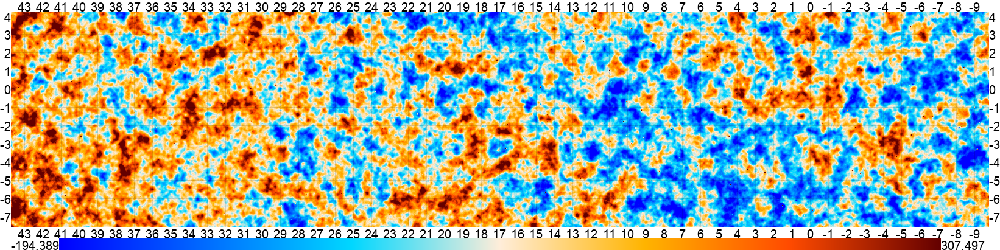

In [ ]:
# show the map
enplot.pshow(map_act, downgrade=4, colorbar=True) #downgrade the map, so it takes less time to plot, and include the colorbar

## **Projecting to different sky geometries**

Let's start with projecting the ACT map patch onto a new map.

First, we create an empty map that covers a different sky area than the original map (see the map manipulation notebook on how to create a map with an arbitrary shape and wcs).

In [ ]:
# Define area of the new map (wider than the original map)
box = np.array([[-10,46],[7,-13]]) * utils.degree

# Define map geometry
shape_new, wcs_new = enmap.geometry(pos=box,res=0.5 * utils.arcmin,proj='car')
print(shape_new)

# Create an empty ndmap
empty_map = enmap.empty((3,) + shape_new, wcs=wcs_new)

# Show the empty map
#eshow(empty_map[0], **{"downgrade": 4, "colorbar":True}) #downgrade the map, so it takes less time to plot, and include the colorbar

(2040, 7080)


In [ ]:
# Project the original map onto the new map
map_project = enmap.project(map_act, empty_map.shape, wcs=wcs_new)
map_project.shape

(2040, 7080)

Show the ACT map projected onto a new (wider) patch

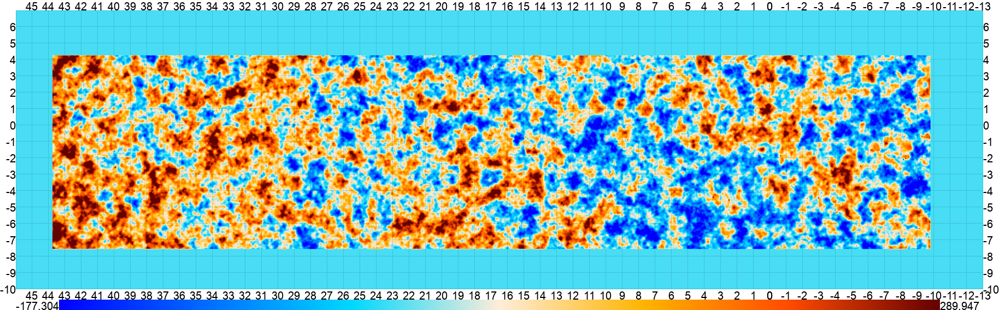

In [ ]:
enplot.pshow(map_project, downgrade=4, colorbar=True) #downgrade the map, so it takes less time to plot, and include the colorbar

Now let's try to extract a smaller patch of the original map, given some shape.

In [ ]:
# Define the shape to extract (# 1/4 of the original map, bottom left corner of the original map)
shape_extract = (map_act.shape[0]/2, map_act.shape[1]/2)

# Extract the patch from the original map
map_extract = enmap.extract(map_act, shape = shape_extract, wcs = map_act.wcs) #keep the same wcs

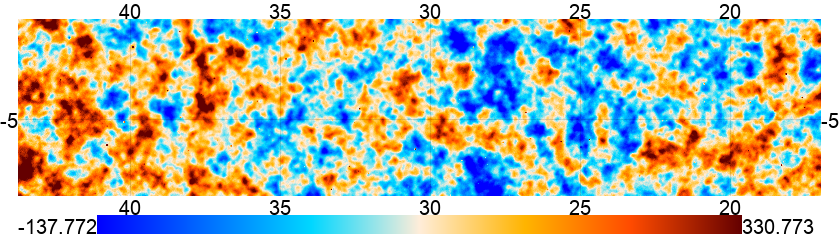

In [ ]:
# Compare the extracted and original map
enplot.pshow(map_extract, downgrade=4, colorbar=True, ticks=5)

## **Getting small cutouts of the map**

Similarly, we can get smaller cutout of the map centered at a given location (which is useful for stacking analyses) with `pixell`'s `reproject.thumbnails` function.

The default projection is `tan` (`proj=tan`), where the thumbnail image is projected onto a local tangent plane, removing the effect of size and shape distortions in the input map.

In [ ]:
# Define the central coordinates and radius of the patch
r = 30*utils.arcmin # radius, in arcminutes
coords = np.deg2rad([ -5., 5.]) # central coordinates, [dec, ra], in radians

# Thumbstack
cutout = reproject.thumbnails(map_act, coords = coords, r=r)

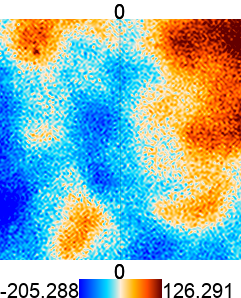

In [ ]:
enplot.pshow(cutout, colorbar=True, ticks=40)

## **Projecting to and from `HEALPix`**




`pixell` allows to reproject (convert) maps from CAR pixelization to `HEALPix`, and back. This can be done using the [reproject](https://github.com/simonsobs/pixell/blob/master/pixell/reproject.py#L115) library.


Let's start by converting the ACT CAR map to `HEALPix` with `reproject.map2healpix`, optionally including a rotation from Celestial/Equatorial (native ACT) to Galactic (native Planck) coordinates.

<ipython-input-18-428c10dc511a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hp.mollview(map_hp, title= "Mollview ACT D56 in Healpix", min = -rang, max = rang, cmap = cm.get_cmap('RdYlBu'))


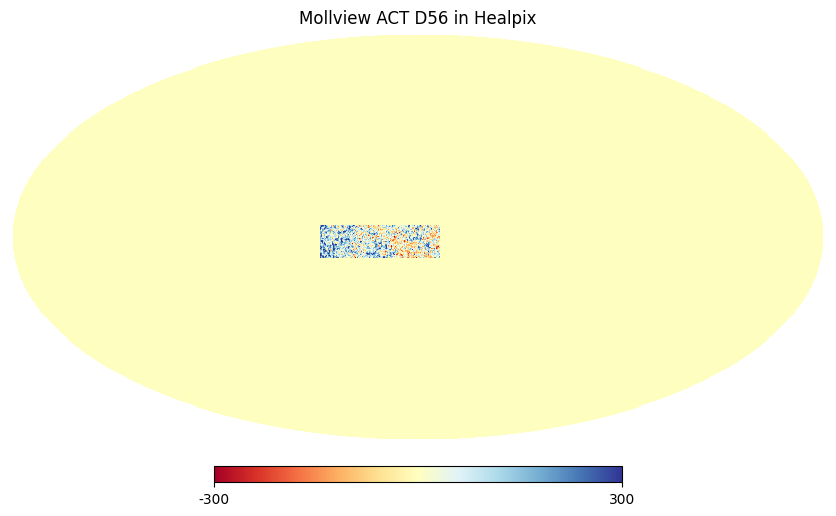

In [ ]:
#reproject the ACT map to Healpix map of a given nside
NSIDE = 2048 # the nside of the healpix map
ELLMAX = 4000 #the reprojection operation will be done up to the chosen ellmax

map_hp = reproject.map2healpix(map_act, nside=NSIDE, lmax=ELLMAX)
#map_hp = reproject.map2healpix(map_act, nside=NSIDE, lmax=ELLMAX, rot="cel,gal") #optionally include rotation

#Normalize plots to this value
rang = 300
hp.mollview(map_hp, title= "Mollview ACT D56 in Healpix", min = -rang, max = rang, cmap = cm.get_cmap('RdYlBu_r'))

Let's look at this `HEALPix` map cutout in Cartesian view

Longitude range = [-9.78 43.77]
Latitude range = [-7.55  4.25]


<ipython-input-19-97490d058d41>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlBu'))


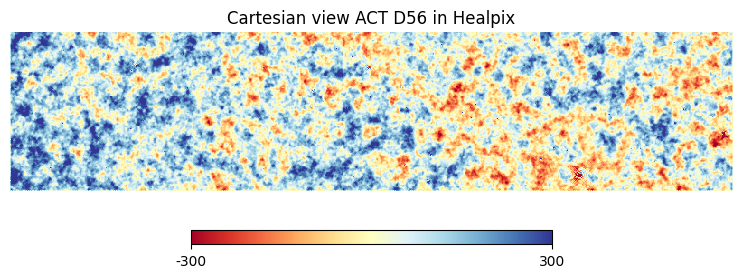

In [ ]:
# Define latitude and longitude range corresponding to the ACT region to pass to hp.cartview
lonra = np.sort(map_act.box()[:, 1])/utils.degree
latra = np.sort(map_act.box()[:, 0])/utils.degree
print("Longitude range =", np.round(lonra,2) )
print("Latitude range =", np.round(latra,2) )

hp.cartview(map_hp, lonra = lonra, latra = latra, min = -rang, max = rang, title = "Cartesian view ACT D56 in Healpix",
            cmap = cm.get_cmap('RdYlBu_r'))

Now let's convert a `HEALPix` *Planck* map to CAR. We start by reading in the Planck map using `hp.read_map` and plotting it `hp.mollview`.

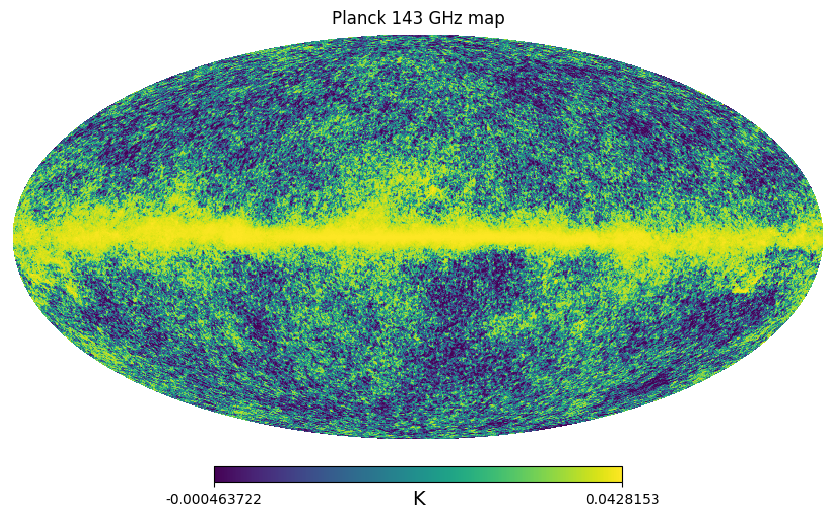

In [ ]:
# Read in and plot Planck 143 GHz map
# note that generally Planck maps are in K, while ACT maps in uK

map_planck = hp.read_map("HFI_SkyMap_143_2048_R2.02_nominal.fits")

hp.mollview(map_planck, title = "Planck 143 GHz map", unit = "K", norm="hist")

In [ ]:
# Plot using healpy
lonra = np.sort(map_act.box()[:, 1])/utils.degree
latra = np.sort(map_act.box()[:, 0])/utils.degree
rang = 300
print(lonra, latra)

[-9.77916667 43.77083333] [-7.54583333  4.25416667]


<ipython-input-22-ae6ab51824f2>:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlBu_r'))


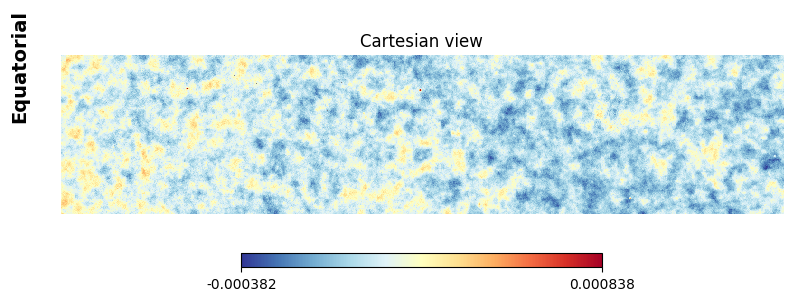

In [ ]:
hp.cartview(map_planck, lonra = lonra, latra = latra, coord=["G","C"], flip="astro",
            cmap = cm.get_cmap('RdYlBu_r'))

Now let's reproject the map into CAR using `reproject.healpix2map`. You can specify the shape, wcs, lmax as well as whether you want to include rotation (here we rotate from Galactic coordinates to Celestial with `rot="gal,cel"`). The `method` option controls how to interpolate between the input and output pixelization; the default option is `harm`, which uses spherical harmonics to do the interpolation.

In [ ]:
# Reproject Planck map to CAR, given shape and wcs (include rotation rot="gal,equ" )
map_planck_car_harm = reproject.healpix2map(map_planck, shape = map_act.shape, wcs = map_act.wcs, lmax=ELLMAX, method="harm", rot="gal,cel")


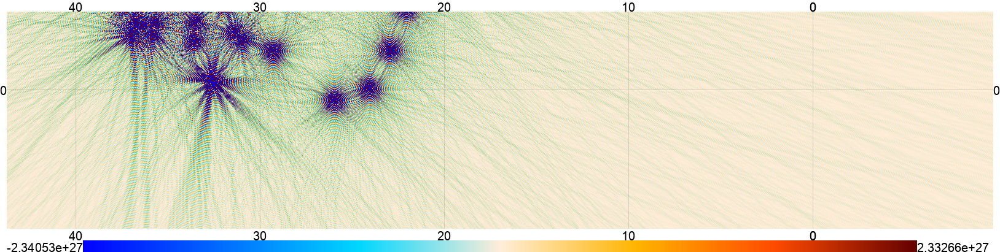

In [ ]:
enplot.pshow(map_planck_car_harm, **{"downgrade": 4, "colorbar":True, "ticks": 10} )

Seems like the interpolation didn't work very well, likely due to bright sources in the map. Let's use the `spline` method instead. `spline` is also recommended for masks. Beware that `spline` might not necessarily preserve power.

In [ ]:
# Reproject Planck map to CAR, given shape and wcs (include rotation rot="gal,equ" )
map_planck_car = reproject.healpix2map(map_planck, shape = map_act.shape, wcs = map_act.wcs, lmax=ELLMAX, method="spline", rot="gal,cel")


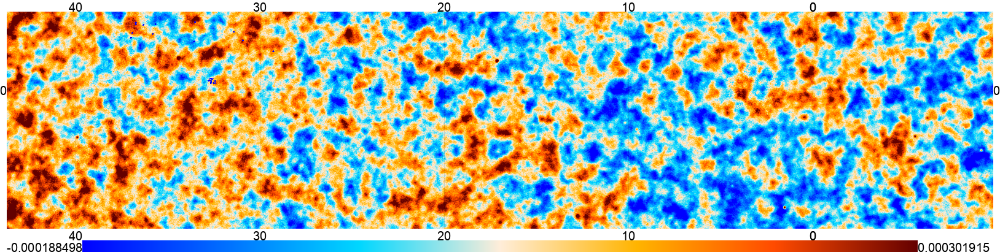

In [ ]:
enplot.pshow(map_planck_car, downgrade=4, colorbar=True, ticks=10)

Compare with the reprojected *Planck* 143 GHz map with the ACT map!

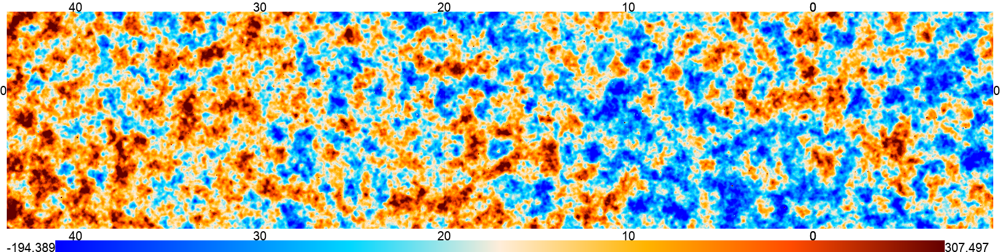

In [ ]:
enplot.pshow(map_act, downgrade=4, colorbar=True, ticks=10)

In general, one has to be very careful with interpolation and reprojection for these reasons: spherical harmonics can bandlimit sharp features in the map and introduce ringing, while spline interpolation can distort map statistics. These drawbacks are unavoidable and a user will need to tailor approaches to their particular situation, or come up with workarounds (like masking bright point sources, for example).